## LOAD PACKAGE

In [1]:
#| export

# import kagglehub
# !pip install peft

import os
import io
import re
import random
import base64
from io import BytesIO

import time
from datetime import timedelta

import numpy as np

import matplotlib.pyplot as plt

import torch
import torch.nn.functional as F

from IPython.display import SVG

from PIL import Image
import PIL


import cv2


from diffusers import StableDiffusionPipeline
from transformers import AutoProcessor, AutoModel
import metric


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

decoded text =  100
decoded text =  100
Does <image> portray "SVG illustration of a red circle" without any lettering? Answer yes or no.
decoded text =  100
decoded text =  100


## Competition Metric Helpers

We also want to evaluate metrics of the original bitmap before converting to svg. Let’s implement it using [metric package](https://www.kaggle.com/code/jiazhuang/svg-image-fidelity).

In [2]:
import numpy as np
import statistics
import pandas as pd

def image_resize(image, size=(384, 384)):
    return image.convert('RGB').resize(size)

def bitmap_score_instance_impl(multiple_choice_qa, image, random_seed=42):
    rng = np.random.RandomState(random_seed)
    group_seed = rng.randint(0, np.iinfo(np.int32).max)
    image_processor = metric.ImageProcessor(image=image_resize(image), seed=group_seed).apply()
    image = image_processor.image.copy()
    questions = multiple_choice_qa['question']
    choices = multiple_choice_qa['choices']
    answers = multiple_choice_qa['answer']
    aesthetic_score = metric.aesthetic_evaluator.score(image)
    vqa_score = metric.vqa_evaluator.score(questions, choices, answers, image)
    image_processor.reset().apply_random_crop_resize().apply_jpeg_compression(quality=90)
    ocr_score = metric.vqa_evaluator.ocr(image_processor.image)
    instance_score = metric.harmonic_mean(vqa_score, aesthetic_score, beta=0.5) * ocr_score
    return instance_score, vqa_score, ocr_score, aesthetic_score

def bitmap_score_instance(multiple_choice_qa, image, random_seed=42):
    is_single = not isinstance(image, list)
    if is_single:
        multiple_choice_qa = [multiple_choice_qa]
        image = [image]
    
    assert len(multiple_choice_qa) == len(image)

    results = []
    score_df = []
    for one_image, one_multiple_choice_qa in zip(image, multiple_choice_qa, strict=True):
        instance_score, vqa_score, ocr_score, aesthetic_score = bitmap_score_instance_impl(one_multiple_choice_qa, one_image, random_seed=42)
        results.append(instance_score)
        score_df.append([instance_score, vqa_score, ocr_score, aesthetic_score])

    fidelity = statistics.mean(results)
    score_df = pd.DataFrame(score_df, columns=['competition_score', 'vqa_score', 'ocr_score', 'aesthetic_score'])
    if is_single:
        return score_df.iloc[0].to_dict()
    else:
        return float(fidelity), score_df

## Refiner

In [ ]:
import torch
from diffusers import DiffusionPipeline, DDIMScheduler
from diffusers import AutoencoderKL

device = "cuda:0" if torch.cuda.is_available() else "cpu"


# load both base & refiner
sdxl_model_path = 'stable-diffusion-xl-base-1.0'
sdxl_turbo_path = 'sdxl-turbo'
sdxl_refiner_path = 'stable-diffusion-xl-pytorch-refiner-1-0-v1'
hunyuan_path = "HunyuanDiT-v1.2-Diffusers-Distilled"



scheduler = DDIMScheduler.from_pretrained(
    hunyuan_path,
    subfolder="scheduler"
)

# load HunyuanDiT‑v1.2‑Distilled as a Diffusers pipeline
base = DiffusionPipeline.from_pretrained(
    hunyuan_path,
    torch_dtype=torch.float16,
    use_safetensors=True,
).to(device)

base.transformer = torch.compile(base.transformer, mode="reduce-overhead", backend="eager", fullgraph=True)

# refiner = DiffusionPipeline.from_pretrained(
#     sdxl_refiner_path,
#     vae=base.vae,
#     scheduler=scheduler,
#     torch_dtype=torch.float16,
#     use_safetensors=True,
#     variant="fp16",
# )
# refiner.to(device)
# refiner.unet = torch.compile(refiner.unet, mode="reduce-overhead", backend="eager", fullgraph=True)



Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.hunyuandit.pipeline_hunyuandit.HunyuanDiTPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [4]:
from diffusers.utils import numpy_to_pil

def generate_bitmap(prompt, negative_prompt="", num_inference_steps=20, base_steps = 10, guidance_scale=0):
    
    # run both experts
    image = base(
        prompt=prompt,
        negative_prompt=negative_prompt,
        num_inference_steps=25,
        guidance_scale=20,
        # output_type="latent",
    ).images[0]

    # image = refiner(
    #     prompt=prompt,
    #     negative_prompt=negative_prompt,
    #     width=1024,
    #     height=1024,
    #     denoising_start=0.8,
    #     num_inference_steps=30,
    #     guidance_scale=20,
    #     image=image,
    # ).images[0]
    
    return image

## Load Data

In [5]:
import pandas as pd
import json

In [6]:
train_df = pd.read_csv('train.csv')
train_question_df = pd.read_parquet('questions.parquet')

In [7]:
train_question_df = train_question_df.groupby('id').apply(lambda df: df.to_dict(orient='list'))
train_question_df = train_question_df.reset_index(name='qa')

train_question_df['question'] = train_question_df.qa.apply(lambda qa: json.dumps(qa['question'], ensure_ascii=False))

train_question_df['choices'] = train_question_df.qa.apply(
    lambda qa: json.dumps(
        [x.tolist() for x in qa['choices']], ensure_ascii=False
    )
)

train_question_df['answer'] = train_question_df.qa.apply(lambda qa: json.dumps(qa['answer'], ensure_ascii=False))

train_df = pd.merge(train_df, train_question_df, how='left', on='id')

train_df['multiple_choice_qa'] = train_df.apply(
    lambda r: {
    'question': json.loads(r.question),
    'choices': json.loads(r.choices),
    'answer': json.loads(r.answer)
    },
    axis=1,
)

train_df.head()

C:\Users\YongsanHuang\AppData\Local\Temp\ipykernel_4868\3218796089.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  train_question_df = train_question_df.groupby('id').apply(lambda df: df.to_dict(orient='list'))


,id,description,qa,question,choices,answer,multiple_choice_qa
0,02d892,a purple forest at dusk,"{'id': ['02d892', '02d892', '02d892', '02d892'...","[""What is the main setting of the image?"", ""Is...","[[""beach"", ""desert"", ""forest"", ""mountain""], [""...","[""forest"", ""yes"", ""dusk"", ""purple""]",{'question': ['What is the main setting of the...
1,0dcd2e,gray wool coat with a faux fur collar,"{'id': ['0dcd2e', '0dcd2e', '0dcd2e', '0dcd2e'...","[""What color is the coat?"", ""What part of the ...","[[""blue"", ""brown"", ""gray"", ""red""], [""collar"", ...","[""gray"", ""collar"", ""no"", ""wool""]","{'question': ['What color is the coat?', 'What..."
2,1e9ac1,a lighthouse overlooking the ocean,"{'id': ['1e9ac1', '1e9ac1', '1e9ac1', '1e9ac1'...","[""Is there an ocean visible in the image?"", ""W...","[[""no"", ""yes""], [""inside"", ""next to"", ""overloo...","[""yes"", ""overlooking"", ""no"", ""no""]",{'question': ['Is there an ocean visible in th...
3,2b25db,burgundy corduroy pants with patch pockets and...,"{'id': ['2b25db', '2b25db', '2b25db', '2b25db'...","[""Are the pants yellow?"", ""Do the pants have p...","[[""no"", ""yes""], [""no"", ""yes""], [""no"", ""yes""], ...","[""no"", ""yes"", ""yes"", ""pants""]","{'question': ['Are the pants yellow?', 'Do the..."
4,4e6a54,orange corduroy overalls,"{'id': ['4e6a54', '4e6a54', '4e6a54', '4e6a54'...","[""What material is the item?"", ""Is a hat depic...","[[""corduroy"", ""denim"", ""leather"", ""silk""], [""n...","[""corduroy"", ""no"", ""yes"", ""overalls""]","{'question': ['What material is the item?', 'I..."


## FUNCTION img -> svg

In [8]:
import re
import vtracer
from IPython.display import SVG, display, Image
from PIL import Image as PILImage
input_path = "output.png"
output_path = "output.svg"

In [9]:
def convert_paths_to_polygons(svg_code: str, size: int) -> str:
    # Find all path elements
    scale_factor = 384 / size

    path_pattern = re.compile(
        r'<path[^>]*d="([^"]+)"[^>]*fill="([^"]+)"[^>]*transform="translate\(([^)]+)\)"[^>]*/?>'
    )
    paths = path_pattern.findall(svg_code)

    polygons = []

    for d_content, fill_color, translate in paths:
        tx, ty = map(float, translate.split(','))
        points = []
        tokens = re.findall(r'[MLZmlz]|-?\d+\.?\d*,\-?\d+\.?\d*', d_content.strip())
        for token in tokens:
            if token in {'M', 'L', 'Z', 'm', 'l', 'z'}:
                continue
            x_str, y_str = token.split(',')
            x = int(round(float(x_str) + tx))
            y = int(round(float(y_str) + ty))
            points.append(f"{x},{y}")

        if points:
            polygon = f'<polygon points="{" ".join(points)}" fill="{fill_color}"/>'
            polygons.append(polygon)

    # Build the compact SVG
    new_svg = (
        f'<svg width="384" height="384" viewBox="0 0 384 384"><g transform="scale({scale_factor})">'
        + "".join(polygons)
        + '</g></svg>'
    )

    return new_svg


def fix_svg_size(svg_code: str, target_size: int = 384) -> str:
    """
    Update the <svg> tag's width and height to match target size.
    """
    # Replace width attribute
    svg_code = re.sub(
        r'(width\s*=\s*")([^"]+)(")',
        lambda m: f'{m.group(1)}{target_size}{m.group(3)}',
        svg_code,
        count=1
    )
    # Replace height attribute
    svg_code = re.sub(
        r'(height\s*=\s*")([^"]+)(")',
        lambda m: f'{m.group(1)}{target_size}{m.group(3)}',
        svg_code,
        count=1
    )
    return svg_code


def bitmap_to_svg_layered(img, input_path, output_path):
    
    # Define input and output paths
    # (input_path and output_path are already passed as arguments)

    # Step 1: Resize the input image to 256x256
    # 256x256 is helpful bc each length od path is shorter, so with the same max_svg_length, we can have more paths(more color)
    size = 128
    img = img.resize((size,size), PILImage.LANCZOS)
    img.save(input_path)

    # Step 2: Convert the resized image to SVG
    layer_difference = 10  # initial value
    max_svg_length = 9996  # target length limit

    # Define injection to prevent OCR hallucination
    injection_a1 = '\n<path d="M5 374 L10 364 L15 374 M7 368 L13 368" stroke="white"/>'      # Bottom-left A
    injection_a2 = '\n<path d="M364 30 L370 20 L376 30 M367 25 L373 25" stroke="white"/>'         # Top-right A
    injection = injection_a1 + injection_a2
    injection_length = len(injection)

    while True:
        vtracer.convert_image_to_svg_py(
            input_path,
            output_path,
            colormode='color',        # Options: 'color' or 'binary'
            hierarchical='stacked',   # Options: 'stacked' or 'cutout'
            mode='polygon',           # Options: 'spline', 'polygon', or 'none'
            filter_speckle=3,          # remove tiny regions
            color_precision=8,         # reduce color complexity
            layer_difference=layer_difference,  # more aggressive merging
            corner_threshold=10,       # remove subtle corners
            length_threshold=10,       # remove short paths
            max_iterations=10,         # faster, less detail
            splice_threshold=10,       # simplify curves
            path_precision=3           # reduce vertex detail
        )

        # Step 3: Read and display the SVG
        try:
            with open(output_path, "r", encoding="utf-8") as f:
                svg_code = f.read()
        except UnicodeDecodeError:
            # Bad SVG output (probably corrupted), try again
            continue  # go back to start of while loop

        # Clean the first two lines if present
        lines = svg_code.splitlines()
        removed_length = 0
        if lines and lines[0].strip().startswith('<?xml'):
            removed_length += len(lines[0]) + 1  # +1 for newline
            lines = lines[1:]
        if lines and lines[0].strip().startswith('<!--'):
            removed_length += len(lines[0]) + 1  # +1 for newline
            lines = lines[1:]
        svg_code = "\n".join(lines)

        svg_code = svg_code.replace(
            '<svg ',
            '<svg viewBox="0 0 384 384" ', #this is 20 bytes more
            1  # only replace first occurrence
        )
        
        # remove version and xmlns attributes
        svg_code = re.sub(r'\s*version="[^"]*"', '', svg_code)
        svg_code = re.sub(r'\s*xmlns="[^"]*"', '', svg_code)

        # use polygon instead of path
        svg_code = convert_paths_to_polygons(svg_code, size)
            
        # Correct length check: give credit for removed lines
        if len(svg_code) + injection_length <= max_svg_length: # acount for injection
            break
        else:
            layer_difference += 10

    svg_code = fix_svg_size(svg_code, target_size=384) # doesnt change length

    # Inject fake letter path to prevent OCR hallucination
    svg_code = svg_code.replace("</svg>", injection + "</svg>")

    print(f'{layer_difference=}')
      

    return svg_code

## SD evaluator

In [10]:
# | export
# def get_aes_and_ocr_score(svg_content):
#     image_processor = metric.ImageProcessor(image=metric.svg_to_png(svg_content), seed=42).apply()
#     image = image_processor.image.copy()
#     aesthetic_score = metric.aesthetic_evaluator.score(image)
#     image_processor.reset().apply_random_crop_resize().apply_jpeg_compression(quality=90)
#     ocr_score = metric.vqa_evaluator.ocr(image_processor.image)
#     return aesthetic_score, ocr_score

def get_aes_and_ocr_score(svg_content, aes=True, ocr=True):
    image_processor = metric.ImageProcessor(image=metric.svg_to_png(svg_content), seed=42).apply()
    image = image_processor.image.copy()


    aesthetic_score = metric.aesthetic_evaluator.score(image) if aes else 1.0

    if ocr:
        image_processor.reset().apply_random_crop_resize().apply_jpeg_compression(quality=90)
        ocr_score = metric.vqa_evaluator.ocr(image_processor.image)
    else:
        ocr_score = 1.0

    return aesthetic_score, ocr_score



## Warm-up for torch.compile()

  0%|          | 0/25 [00:00<?, ?it/s]

W0503 17:41:17.880000 4868 site-packages\torch\_dynamo\backends\debugging.py:30] [0/0] eager backend ignoring extra kwargs {'mode': 'reduce-overhead'}
c:\Users\YongsanHuang\.conda\envs\sd\Lib\site-packages\diffusers\image_processor.py:147: RuntimeWarning: invalid value encountered in cast
  images = (images * 255).round().astype("uint8")


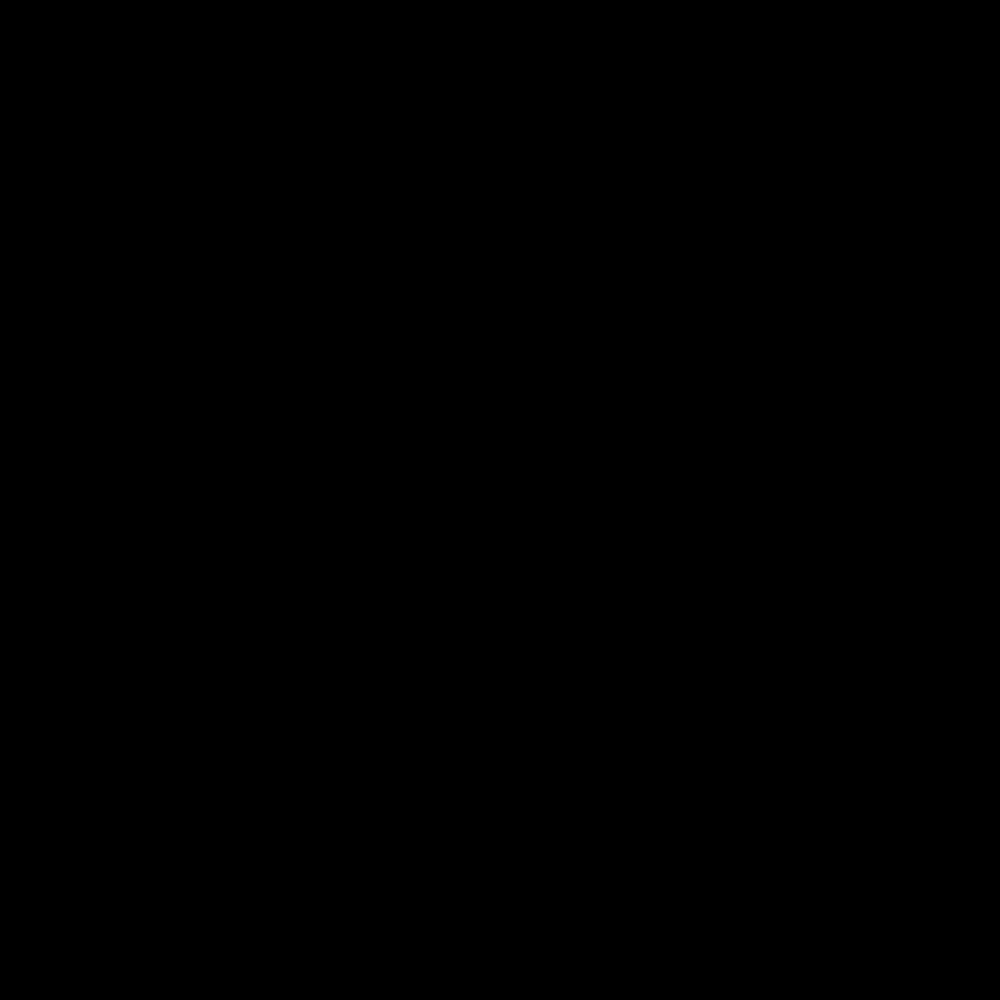

(1024, 1024)
CPU times: total: 16 s
Wall time: 37.9 s


In [11]:
%%time
#| export
# triiger the compilation first
description = 'purple pyramids spiraling around a bronze cone'
img = generate_bitmap(prompt = description, negative_prompt = '')
display(img)
print(img.size)

## Implement the package Model class

In [12]:
#| export

class Model:
    
    def __init__(self):

        self.default_svg = """<svg width="384" height="384" viewBox="0 0 384 384"><circle cx="50" cy="50" r="40" fill="red" /></svg>"""
        self.prompt_prefix = "Simple, classic image of"
        self.prompt_suffix = "with flat color blocks, beautiful, minimal details, solid colors only"
        self.negative_prompt = "text, signature, framing, hatching, background, textures, patterns, lines, outlines"
        # self.num_inference_steps = 25
        # self.guidance_scale = 20
        self.num_attempt = 3

    def gen_bitmap(self, description):
        prompt = f'{self.prompt_prefix} {description}{self.prompt_suffix}'
        bitmap = generate_bitmap(prompt = prompt, negative_prompt=self.negative_prompt)
        return bitmap

    def predict_impl(self, prompt: str) -> str:
        best_score = 0.0
        best_svg = None
        best_img = None
        print(f'======= {prompt} =======')
        for i in range(self.num_attempt):
            bitmap = self.gen_bitmap(prompt)
            display(bitmap.resize((256, 256), PIL.Image.LANCZOS))
            svg = bitmap_to_svg_layered(bitmap, input_path, output_path)
            aesthetic_score, ocr_score = get_aes_and_ocr_score(svg)
            score = aesthetic_score * ocr_score
            print(f'{score=}')
            print('svg length:', len(svg))
            if score >= best_score:
                best_score = score
                best_svg = svg
                best_img = bitmap
                # print('update score:', best_score)
        print('final score:', best_score)
        print('=======================================================================')
        
        if best_svg is None:
            best_svg = self.default_svg

        return best_svg, best_img

    def predict(self, prompt: str) -> str:
        svg, img = self.predict_impl(prompt)
        return svg

In [13]:
model = Model()

In [14]:
%%time
r = train_df.iloc[9]
description = r.description
svg, img = model.predict_impl(description)
display(img)
display(SVG(svg))
print(svg)

======= magenta trapezoids layered on a transluscent silver sheet =======


  0%|          | 0/25 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
metric.score_instance(r.multiple_choice_qa, svg, random_seed=42)

decoded text =  A


{'competition_score': 0.362987061817765,
 'vqa_score': 0.3480673754946613,
 'ocr_score': 1.0,
 'aesthetic_score': 0.43810310363769533}

## Evaluate on train dataset (LB prediction!)

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
import pandas as pd
from tqdm.auto import tqdm
tqdm.pandas()

In [ ]:
train_df.head()

,id,description,qa,question,choices,answer,multiple_choice_qa
0,02d892,a purple forest at dusk,"{'id': ['02d892', '02d892', '02d892', '02d892'...","[""What is the main setting of the image?"", ""Is...","[[""beach"", ""desert"", ""forest"", ""mountain""], [""...","[""forest"", ""yes"", ""dusk"", ""purple""]",{'question': ['What is the main setting of the...
1,0dcd2e,gray wool coat with a faux fur collar,"{'id': ['0dcd2e', '0dcd2e', '0dcd2e', '0dcd2e'...","[""What color is the coat?"", ""What part of the ...","[[""blue"", ""brown"", ""gray"", ""red""], [""collar"", ...","[""gray"", ""collar"", ""no"", ""wool""]","{'question': ['What color is the coat?', 'What..."
2,1e9ac1,a lighthouse overlooking the ocean,"{'id': ['1e9ac1', '1e9ac1', '1e9ac1', '1e9ac1'...","[""Is there an ocean visible in the image?"", ""W...","[[""no"", ""yes""], [""inside"", ""next to"", ""overloo...","[""yes"", ""overlooking"", ""no"", ""no""]",{'question': ['Is there an ocean visible in th...
3,2b25db,burgundy corduroy pants with patch pockets and...,"{'id': ['2b25db', '2b25db', '2b25db', '2b25db'...","[""Are the pants yellow?"", ""Do the pants have p...","[[""no"", ""yes""], [""no"", ""yes""], [""no"", ""yes""], ...","[""no"", ""yes"", ""yes"", ""pants""]","{'question': ['Are the pants yellow?', 'Do the..."
4,4e6a54,orange corduroy overalls,"{'id': ['4e6a54', '4e6a54', '4e6a54', '4e6a54'...","[""What material is the item?"", ""Is a hat depic...","[[""corduroy"", ""denim"", ""leather"", ""silk""], [""n...","[""corduroy"", ""no"", ""yes"", ""overalls""]","{'question': ['What material is the item?', 'I..."


  0%|          | 0/15 [00:00<?, ?it/s]

======= a purple forest at dusk =======


100%|██████████| 11/11 [00:01<00:00,  9.98it/s]


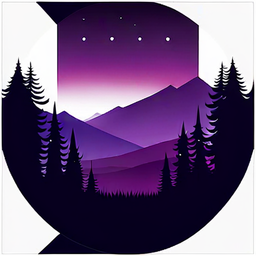

layer_difference=30
decoded text =  A
score=0.49103403091430664
svg length: 8458


100%|██████████| 11/11 [00:01<00:00,  7.81it/s]


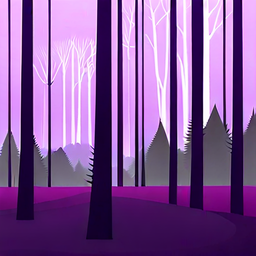

layer_difference=30
decoded text =  A
score=0.5385748386383057
svg length: 8197


100%|██████████| 11/11 [00:01<00:00,  9.06it/s]


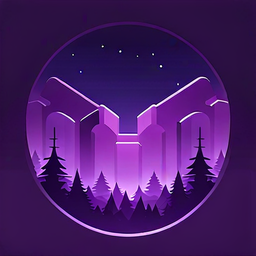

layer_difference=40


 13%|█▎        | 2/15 [00:19<02:07,  9.79s/it]

decoded text =  A
A
score=0.4960024833679199
svg length: 9575
final score: 0.5385748386383057
======= gray wool coat with a faux fur collar =======


100%|██████████| 11/11 [00:01<00:00,  9.79it/s]


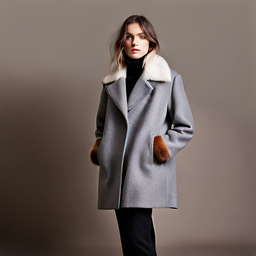

layer_difference=40
decoded text =  A
A
score=0.5086145877838135
svg length: 8510


100%|██████████| 11/11 [00:01<00:00,  9.63it/s]


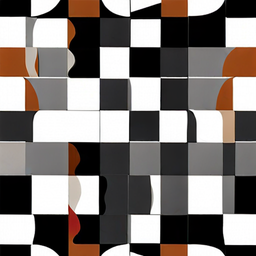

layer_difference=30
decoded text =  A
score=0.38793253898620605
svg length: 9014


100%|██████████| 11/11 [00:01<00:00,  9.37it/s]


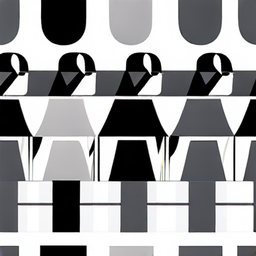

layer_difference=40


 20%|██        | 3/15 [00:38<02:43, 13.62s/it]

decoded text =  A
score=0.4157717704772949
svg length: 9844
final score: 0.5086145877838135
======= a lighthouse overlooking the ocean =======


100%|██████████| 11/11 [00:01<00:00,  7.88it/s]


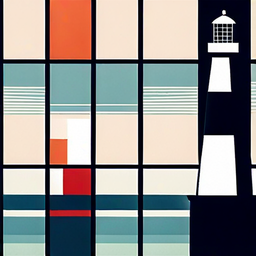

layer_difference=10
decoded text =  A
score=0.4525158405303955
svg length: 8445


100%|██████████| 11/11 [00:01<00:00,  9.85it/s]


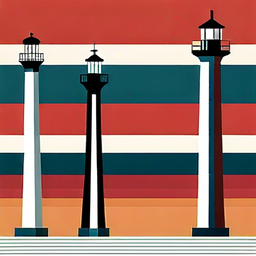

layer_difference=20
decoded text =  A
score=0.5095029354095459
svg length: 8568


100%|██████████| 11/11 [00:01<00:00,  9.67it/s]


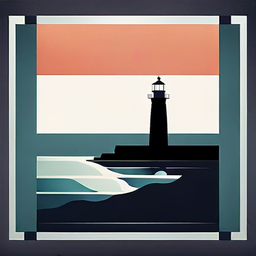

layer_difference=20


 27%|██▋       | 4/15 [00:57<02:51, 15.60s/it]

decoded text =  A
score=0.5094522953033447
svg length: 8333
final score: 0.5095029354095459
======= burgundy corduroy pants with patch pockets and silver buttons =======


100%|██████████| 11/11 [00:01<00:00,  9.43it/s]


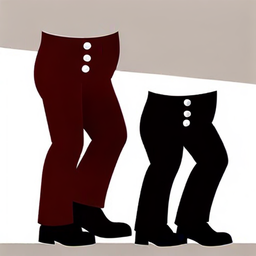

layer_difference=10
decoded text =  A
score=0.4041083812713623
svg length: 5741


100%|██████████| 11/11 [00:01<00:00,  9.62it/s]


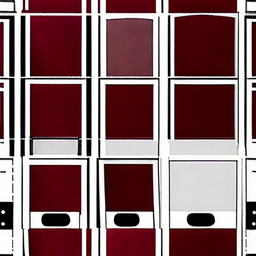

layer_difference=20
decoded text =  A
score=0.4622614860534668
svg length: 8574


100%|██████████| 11/11 [00:01<00:00,  9.12it/s]


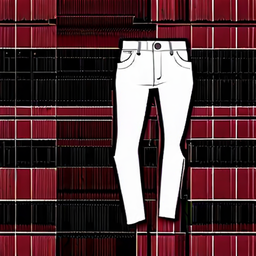

layer_difference=40


 33%|███▎      | 5/15 [01:16<02:46, 16.62s/it]

decoded text =  A
score=0.459016227722168
svg length: 9981
final score: 0.4622614860534668
======= orange corduroy overalls =======


100%|██████████| 11/11 [00:01<00:00, 10.13it/s]


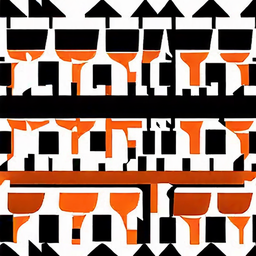

layer_difference=160
decoded text =  A
score=0.41739859580993655
svg length: 9816


100%|██████████| 11/11 [00:01<00:00,  9.39it/s]


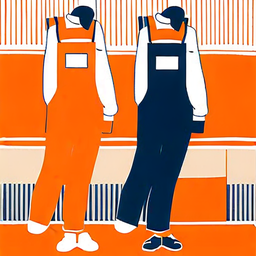

layer_difference=50
decoded text =  A
score=0.47603344917297363
svg length: 9739


100%|██████████| 11/11 [00:01<00:00,  9.08it/s]


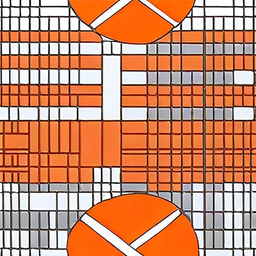

layer_difference=170


 40%|████      | 6/15 [01:36<02:41, 17.93s/it]

decoded text =  A
score=0.427614688873291
svg length: 9023
final score: 0.47603344917297363
======= a purple silk scarf with tassel trim =======


100%|██████████| 11/11 [00:01<00:00,  9.96it/s]


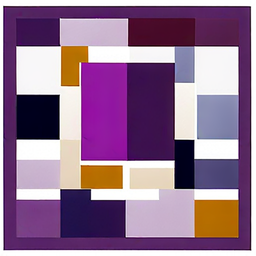

layer_difference=10
decoded text =  A
score=0.43708510398864747
svg length: 7338


100%|██████████| 11/11 [00:01<00:00,  9.64it/s]


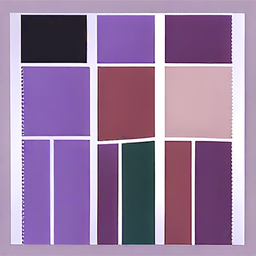

layer_difference=10
decoded text =  A
score=0.36727614402770997
svg length: 6752


100%|██████████| 11/11 [00:01<00:00,  9.12it/s]


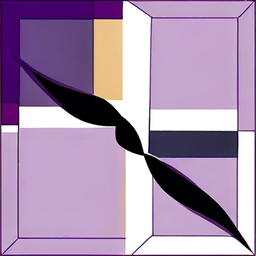

layer_difference=10


 47%|████▋     | 7/15 [01:55<02:27, 18.38s/it]

decoded text =  A
score=0.46268510818481445
svg length: 6937
final score: 0.46268510818481445
======= a green lagoon under a cloudy sky =======


100%|██████████| 11/11 [00:01<00:00,  9.29it/s]


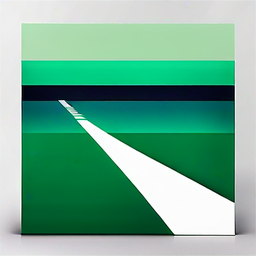

layer_difference=20
decoded text =  A
score=0.4819607734680176
svg length: 6069


100%|██████████| 11/11 [00:01<00:00,  9.43it/s]


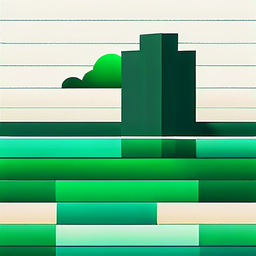

layer_difference=10
decoded text =  A
score=0.48285865783691406
svg length: 6064


100%|██████████| 11/11 [00:01<00:00,  9.66it/s]


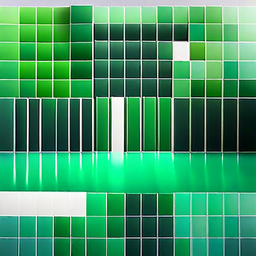

layer_difference=80


 53%|█████▎    | 8/15 [02:15<02:10, 18.67s/it]

decoded text =  A
score=0.43055901527404783
svg length: 8676
final score: 0.48285865783691406
======= crimson rectangles forming a chaotic grid =======


100%|██████████| 11/11 [00:01<00:00,  9.66it/s]


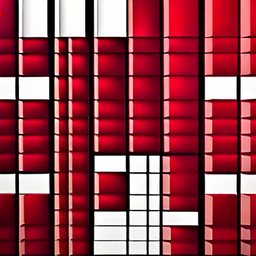

layer_difference=100
decoded text =  A
score=0.486007022857666
svg length: 9016


100%|██████████| 11/11 [00:01<00:00,  8.00it/s]


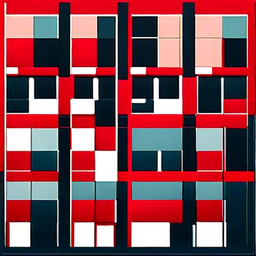

layer_difference=50
decoded text =  A
score=0.4877781391143799
svg length: 9520


100%|██████████| 11/11 [00:01<00:00,  9.03it/s]


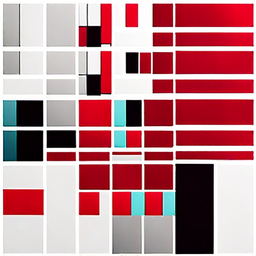

layer_difference=30


 60%|██████    | 9/15 [02:35<01:54, 19.08s/it]

decoded text =  A
score=0.4588470935821533
svg length: 9282
final score: 0.4877781391143799
======= purple pyramids spiraling around a bronze cone =======


100%|██████████| 11/11 [00:01<00:00,  9.33it/s]


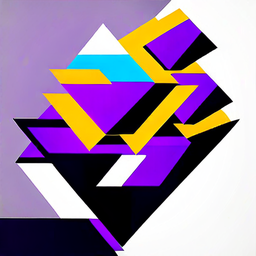

layer_difference=20
decoded text =  A
score=0.45485334396362304
svg length: 9568


100%|██████████| 11/11 [00:01<00:00,  9.14it/s]


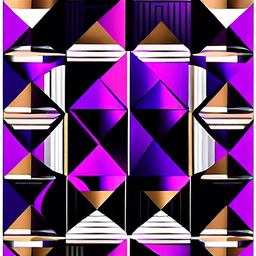

layer_difference=120
decoded text =  A
score=0.45066266059875487
svg length: 9376


100%|██████████| 11/11 [00:01<00:00,  9.94it/s]


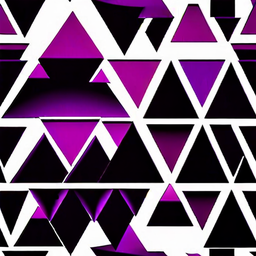

layer_difference=60


 67%|██████▋   | 10/15 [02:55<01:36, 19.32s/it]

decoded text =  A
score=0.47447686195373534
svg length: 9679
final score: 0.47447686195373534
======= magenta trapezoids layered on a transluscent silver sheet =======


100%|██████████| 11/11 [00:01<00:00,  9.84it/s]


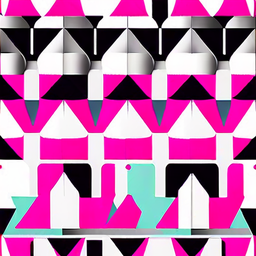

layer_difference=110
decoded text =  A
score=0.4046133041381836
svg length: 9729


100%|██████████| 11/11 [00:01<00:00,  9.65it/s]


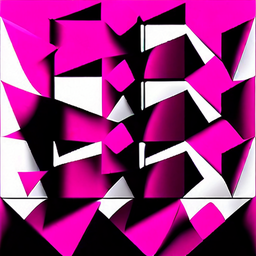

layer_difference=100
decoded text =  A
A
score=0.4180898666381836
svg length: 9236


100%|██████████| 11/11 [00:01<00:00,  9.54it/s]


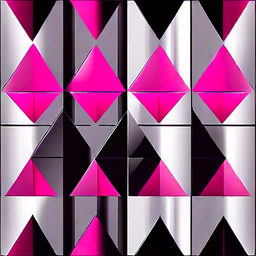

layer_difference=70


 73%|███████▎  | 11/15 [03:15<01:18, 19.53s/it]

decoded text =  A
score=0.46240601539611814
svg length: 9005
final score: 0.46240601539611814
======= a snowy plain =======


100%|██████████| 11/11 [00:01<00:00,  9.78it/s]


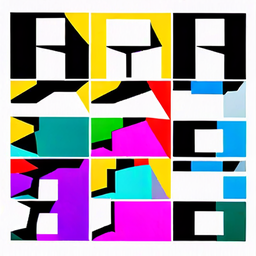

layer_difference=50
decoded text =  A
score=0.42923903465270996
svg length: 8895


100%|██████████| 11/11 [00:01<00:00,  9.44it/s]


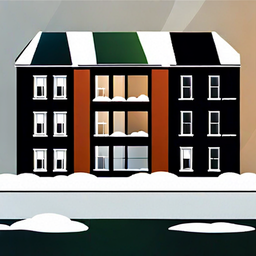

layer_difference=40
decoded text =  A
score=0.5244355201721191
svg length: 9775


100%|██████████| 11/11 [00:01<00:00,  9.34it/s]


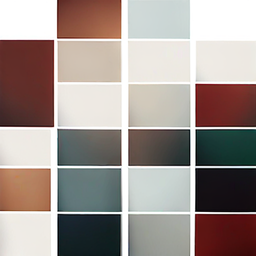

layer_difference=20


 80%|████████  | 12/15 [03:34<00:58, 19.39s/it]

decoded text =  A
score=0.4231905460357666
svg length: 6352
final score: 0.5244355201721191
======= black and white checkered pants =======


100%|██████████| 11/11 [00:01<00:00,  9.60it/s]


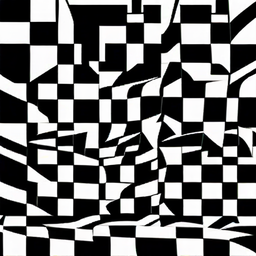

layer_difference=190
decoded text =  A
score=0.4018275260925293
svg length: 9351


100%|██████████| 11/11 [00:01<00:00,  9.60it/s]


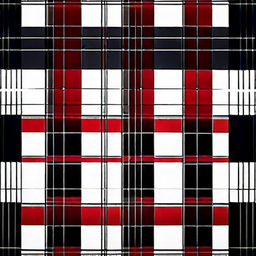

layer_difference=90
decoded text =  A
A
score=0.4670099258422852
svg length: 9756


100%|██████████| 11/11 [00:01<00:00,  9.51it/s]


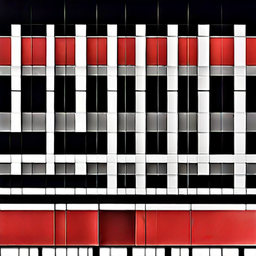

layer_difference=70


 87%|████████▋ | 13/15 [03:54<00:39, 19.59s/it]

decoded text =  A
score=0.48568267822265626
svg length: 9946
final score: 0.48568267822265626
======= a starlit night over snow-covered peaks =======


100%|██████████| 11/11 [00:01<00:00,  8.81it/s]


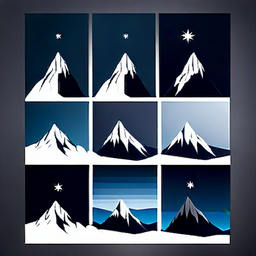

layer_difference=60
decoded text =  A
A
score=0.5069206237792969
svg length: 9138


100%|██████████| 11/11 [00:01<00:00,  8.94it/s]


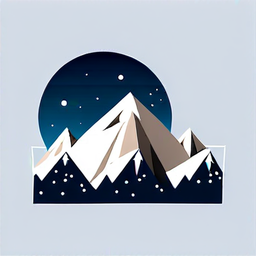

layer_difference=20
decoded text =  +
score=0.5509632110595704
svg length: 8686


100%|██████████| 11/11 [00:01<00:00,  9.75it/s]


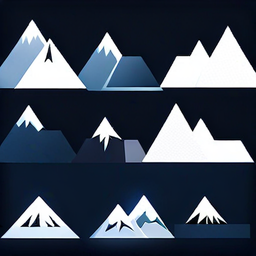

layer_difference=20


 93%|█████████▎| 14/15 [04:13<00:19, 19.60s/it]

decoded text =  A
A
score=0.49386987686157224
svg length: 9845
final score: 0.5509632110595704
======= khaki triangles and azure crescents =======


100%|██████████| 11/11 [00:01<00:00,  9.33it/s]


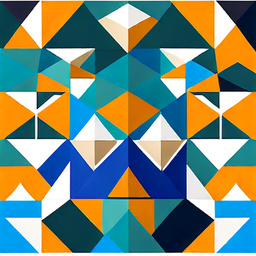

layer_difference=70
decoded text =  A
score=0.5356196403503418
svg length: 8632


100%|██████████| 11/11 [00:01<00:00,  8.80it/s]


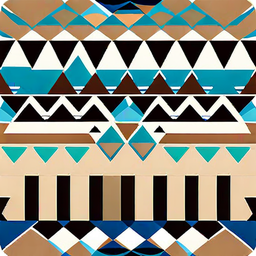

layer_difference=150
decoded text =  A
score=0.4579285144805908
svg length: 9566


100%|██████████| 11/11 [00:01<00:00,  9.94it/s]


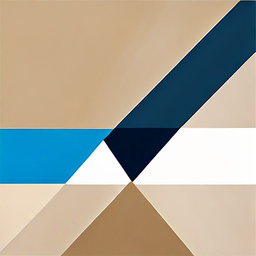

layer_difference=10


100%|██████████| 15/15 [04:33<00:00, 19.64s/it]

decoded text =  A
score=0.4628075122833252
svg length: 5640
final score: 0.5356196403503418
======= a maroon dodecahedron interwoven with teal threads =======


100%|██████████| 11/11 [00:01<00:00,  7.67it/s]


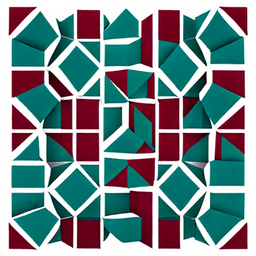

layer_difference=80
decoded text =  A
score=0.4564213275909424
svg length: 9842


100%|██████████| 11/11 [00:01<00:00,  9.11it/s]


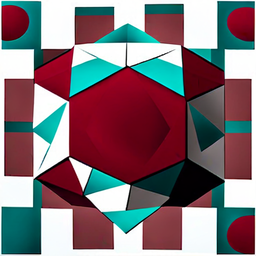

layer_difference=40
decoded text =  A
A
score=0.4629528522491455
svg length: 9117


100%|██████████| 11/11 [00:01<00:00,  9.22it/s]


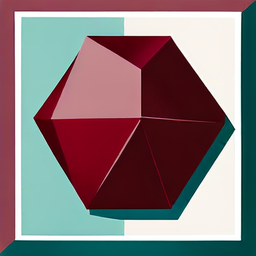

layer_difference=10


100%|██████████| 15/15 [04:53<00:00, 19.58s/it]

decoded text =  A
score=0.47772064208984377
svg length: 6370
final score: 0.47772064208984377
CPU times: total: 1min 43s
Wall time: 4min 53s


In [ ]:
%%time
train_df['raw_res'] = train_df.description.progress_apply(model.predict_impl)

In [ ]:
train_df['svg'] = train_df.raw_res.apply(lambda x: x[0])
train_df['bitmap'] = train_df.raw_res.apply(lambda x: x[1])

In [ ]:
train_df['bitmap_score'] = train_df.progress_apply(
    lambda r: bitmap_score_instance(r.multiple_choice_qa, r.bitmap, random_seed=42),
    axis=1,
)

 13%|█▎        | 2/15 [00:05<00:38,  2.97s/it]

decoded text =  © Getty Images


 20%|██        | 3/15 [00:11<00:47,  3.95s/it]

decoded text =  © PA


 27%|██▋       | 4/15 [00:16<00:48,  4.40s/it]

decoded text =  11


 33%|███▎      | 5/15 [00:21<00:46,  4.63s/it]

decoded text =  0


 40%|████      | 6/15 [00:26<00:44,  4.92s/it]

decoded text =  -


 47%|████▋     | 7/15 [00:32<00:41,  5.14s/it]

decoded text =  ©2016


 53%|█████▎    | 8/15 [00:37<00:36,  5.14s/it]

decoded text =  T


 60%|██████    | 9/15 [00:42<00:30,  5.10s/it]

decoded text =  L


 67%|██████▋   | 10/15 [00:47<00:25,  5.08s/it]

decoded text =  W


 73%|███████▎  | 11/15 [00:53<00:20,  5.21s/it]

decoded text =  © Instagram


 80%|████████  | 12/15 [00:58<00:15,  5.25s/it]

decoded text =  88


 87%|████████▋ | 13/15 [01:04<00:10,  5.32s/it]

decoded text =  © PA


 93%|█████████▎| 14/15 [01:09<00:05,  5.37s/it]

decoded text =  :


100%|██████████| 15/15 [01:15<00:00,  5.42s/it]

decoded text =  M


100%|██████████| 15/15 [01:20<00:00,  5.36s/it]

decoded text =  © Getty Images


In [ ]:
train_df['svg_score'] = train_df.progress_apply(
    lambda r: metric.score_instance(r.multiple_choice_qa, r.svg, random_seed=42),
    axis=1,
)

 13%|█▎        | 2/15 [00:05<00:38,  2.94s/it]

decoded text =  A


 20%|██        | 3/15 [00:11<00:46,  3.86s/it]

decoded text =  A


 27%|██▋       | 4/15 [00:16<00:47,  4.29s/it]

decoded text =  A


 33%|███▎      | 5/15 [00:21<00:45,  4.60s/it]

decoded text =  -


 40%|████      | 6/15 [00:26<00:43,  4.87s/it]

decoded text =  A


 47%|████▋     | 7/15 [00:31<00:40,  5.03s/it]

decoded text =  A


 53%|█████▎    | 8/15 [00:37<00:35,  5.10s/it]

decoded text =  A


 60%|██████    | 9/15 [00:42<00:30,  5.13s/it]

decoded text =  A


 67%|██████▋   | 10/15 [00:47<00:25,  5.17s/it]

decoded text =  A


 73%|███████▎  | 11/15 [00:52<00:20,  5.19s/it]

decoded text =  A


 80%|████████  | 12/15 [00:58<00:15,  5.23s/it]

decoded text =  A


 87%|████████▋ | 13/15 [01:03<00:10,  5.27s/it]

decoded text =  A


 93%|█████████▎| 14/15 [01:09<00:05,  5.33s/it]

decoded text =  A


100%|██████████| 15/15 [01:14<00:00,  5.36s/it]

decoded text =  A


100%|██████████| 15/15 [01:19<00:00,  5.33s/it]

decoded text =  A


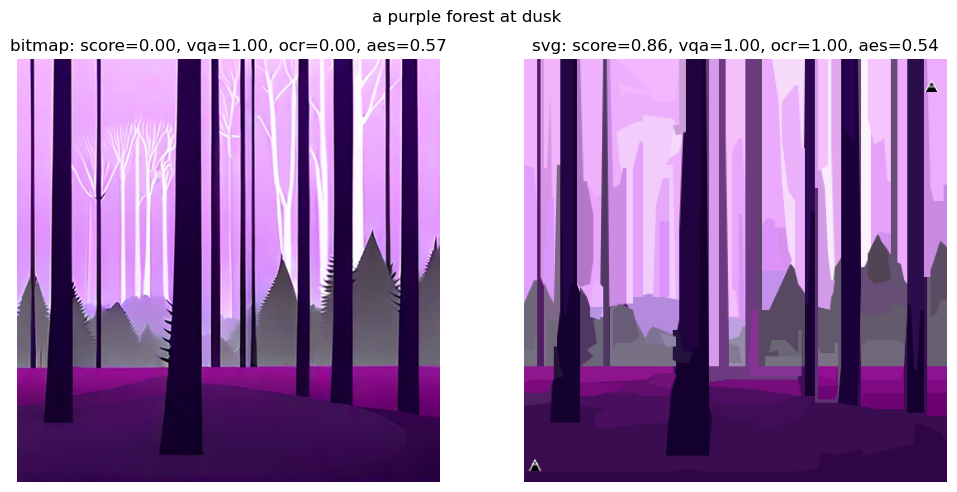

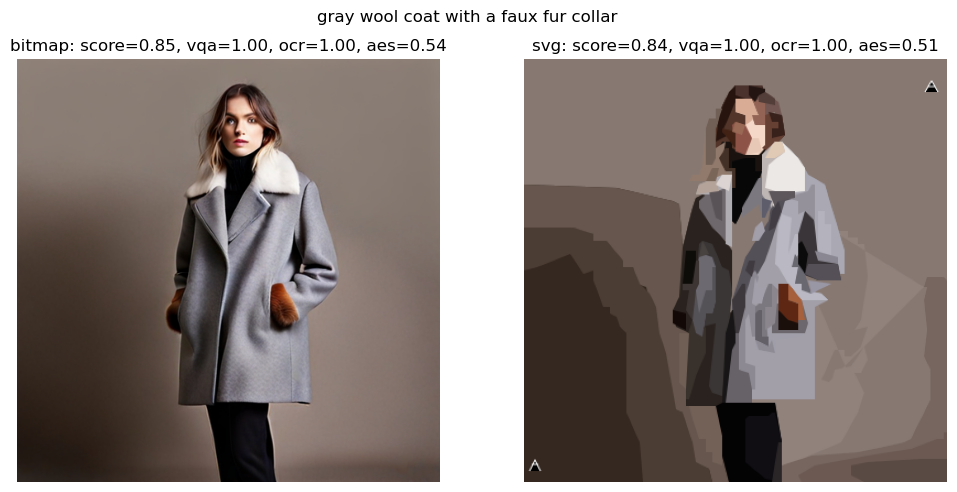

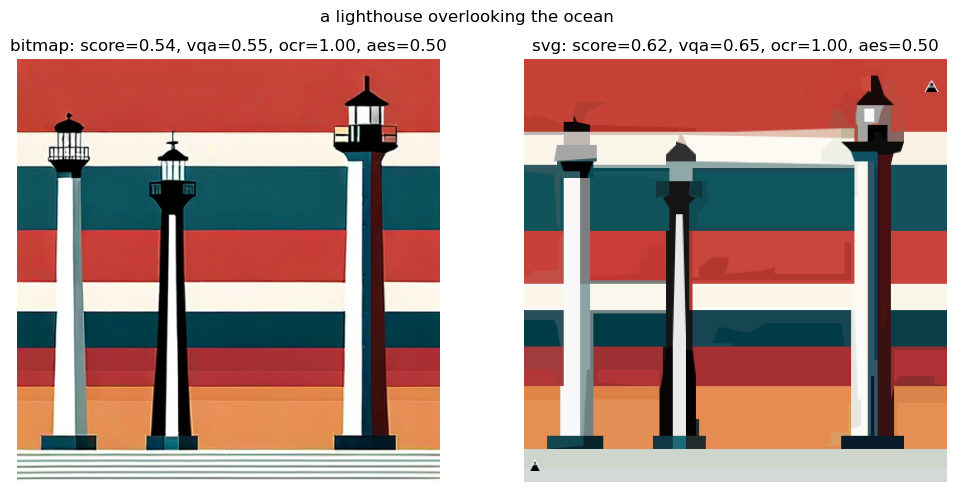

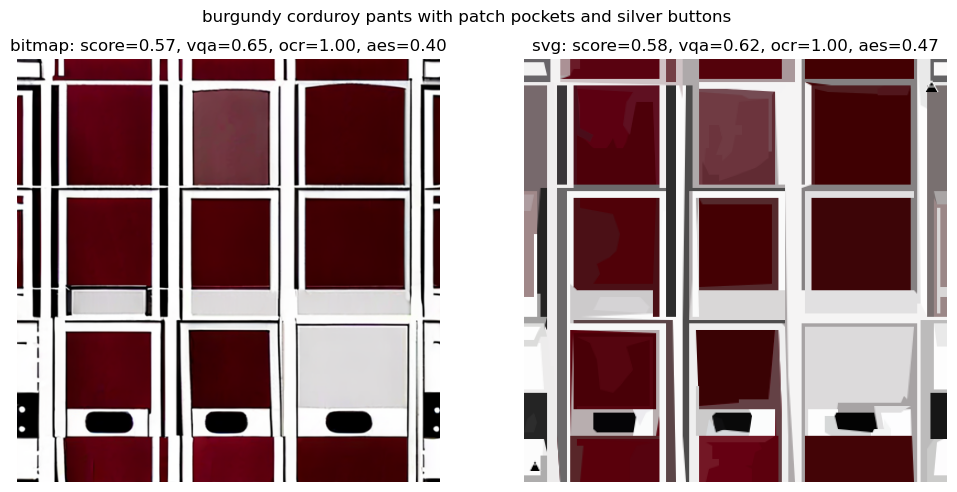

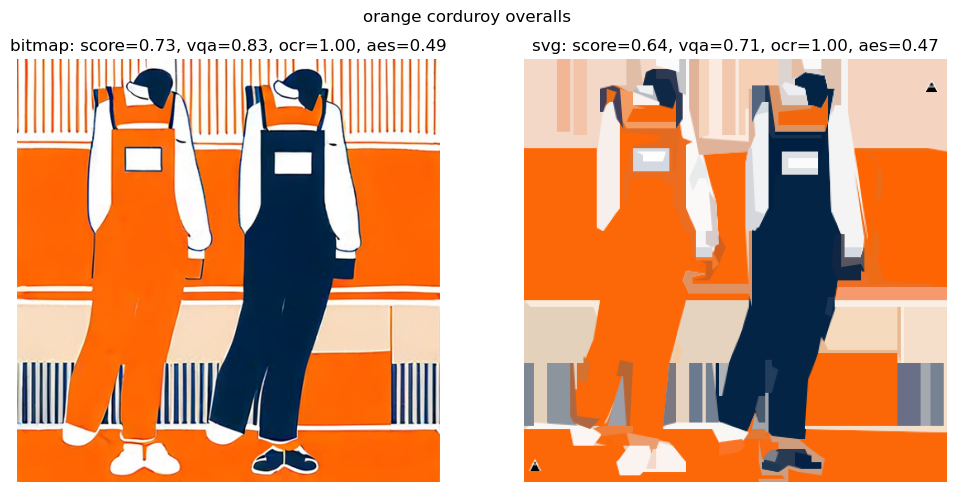

...

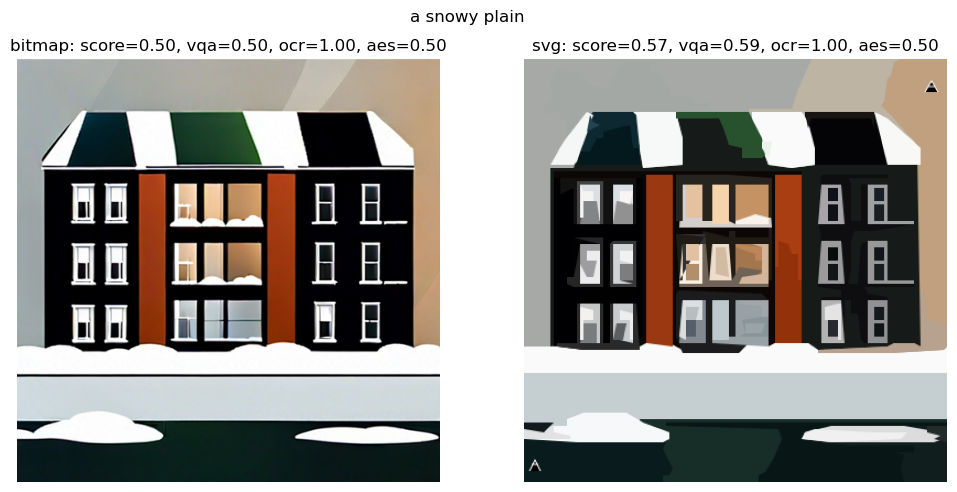

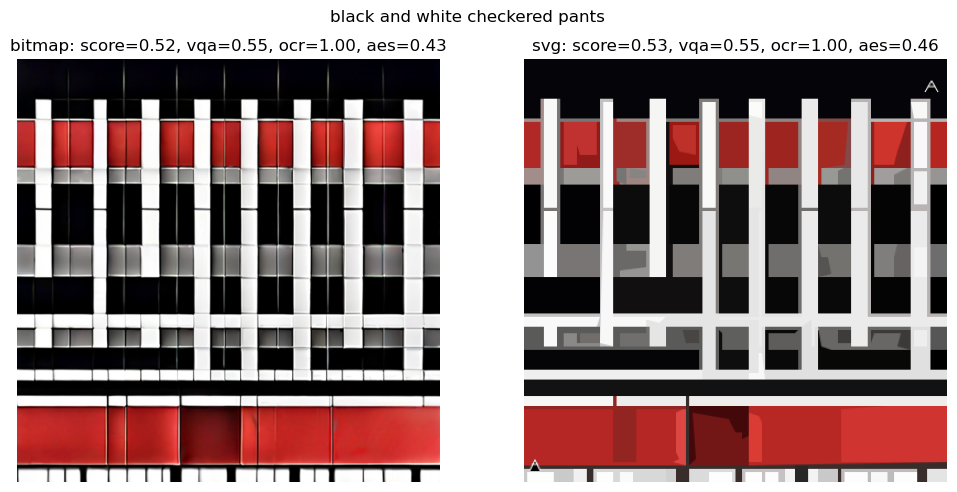

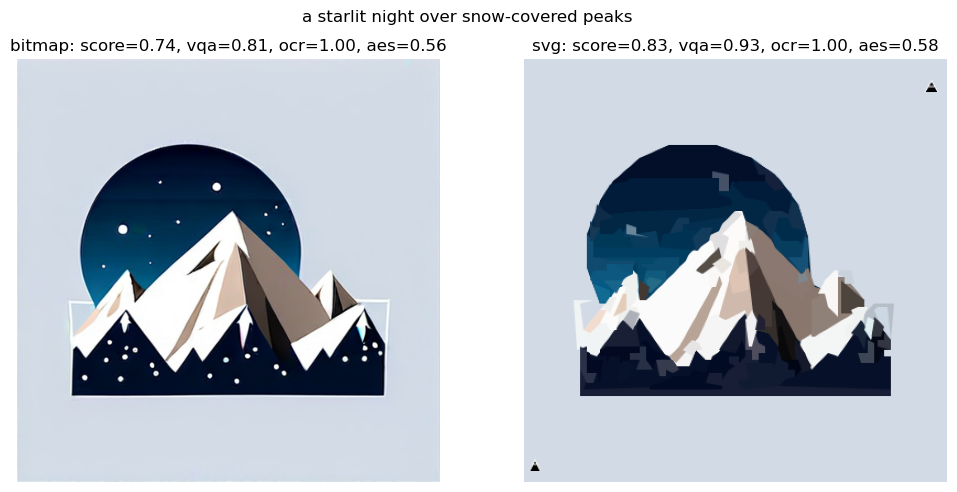

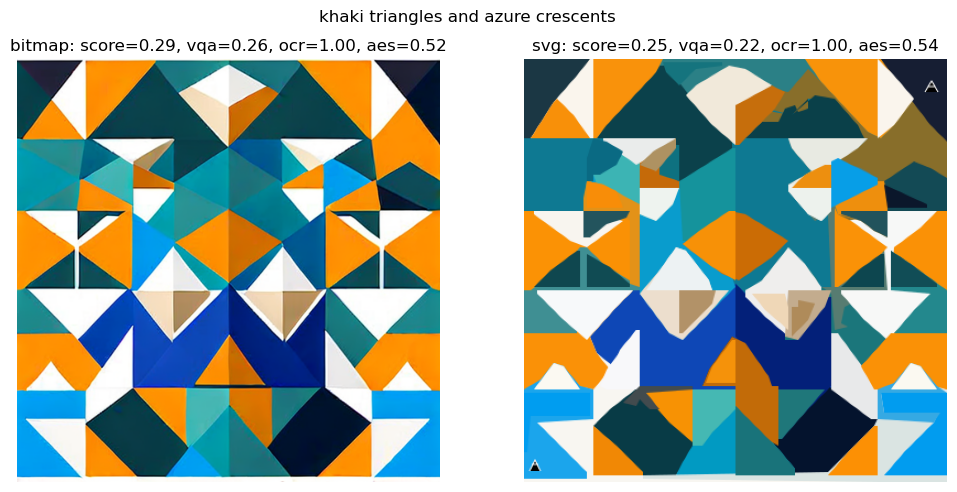

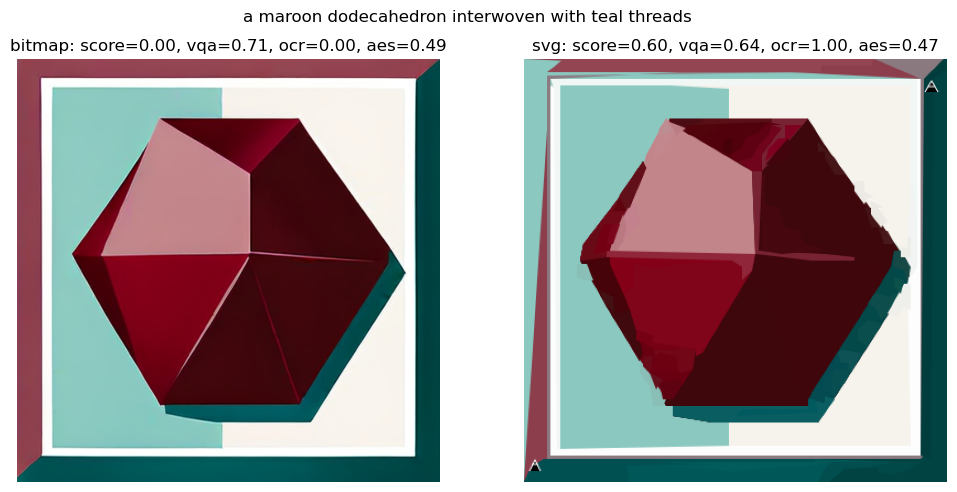

In [ ]:
for r in train_df.itertuples():
    
    b_vqa = r.bitmap_score['vqa_score']
    b_aesthetic = r.bitmap_score['aesthetic_score']
    b_ocr = r.bitmap_score['ocr_score']
    b_score = r.bitmap_score['competition_score']

    
    s_vqa = r.svg_score['vqa_score']
    s_aesthetic = r.svg_score['aesthetic_score']
    s_ocr = r.svg_score['ocr_score']
    s_score = r.svg_score['competition_score']
    
    plt.figure(figsize=(12, 6))
    plt.suptitle(r.description, y=0.93)
    
    plt.subplot(1, 2, 1)
    plt.imshow(np.array(r.bitmap))
    plt.axis('off')
    plt.title(f'bitmap: score={b_score:.2f}, vqa={b_vqa:.2f}, ocr={b_ocr:.2f}, aes={b_aesthetic:.2f}')

    plt.subplot(1, 2, 2)
    plt.imshow(metric.svg_to_png(r.svg))
    plt.axis('off')
    plt.title(f'svg: score={s_score:.2f}, vqa={s_vqa:.2f}, ocr={s_ocr:.2f}, aes={s_aesthetic:.2f}')

In [ ]:
mean_bitmap_score = pd.DataFrame(train_df['bitmap_score'].tolist()).mean(axis=0)
mean_bitmap_score

competition_score    0.433460
vqa_score            0.622129
ocr_score            0.757925
aesthetic_score      0.486006
dtype: float64

In [ ]:
mean_svg_score = pd.DataFrame(train_df['svg_score'].tolist()).mean(axis=0)
mean_svg_score

competition_score    0.588916
vqa_score            0.635879
ocr_score            1.000000
aesthetic_score      0.494600
dtype: float64

In [ ]:
print(f'Original bitmap score: {mean_bitmap_score.competition_score}')
print(f'Final svg score: {mean_svg_score.competition_score}')

Original bitmap score: 0.43345950323383775
Final svg score: 0.5889155460699712
